# Recommender Systems with Python

In [1]:
import numpy as np
import pandas as pd

## Get the Data

In [2]:
column_names = ['user_id', 'item_id', 'rating', 'timestamp']
df = pd.read_csv('u.data', sep='\t', names=column_names)

In [3]:
df.head()

,user_id,item_id,rating,timestamp
0,0,50,5,881250949
1,0,172,5,881250949
2,0,133,1,881250949
3,196,242,3,881250949
4,186,302,3,891717742


Now let's get the movie titles:

In [4]:
movie_titles = pd.read_csv("Movie_Id_Titles")
movie_titles.head()

,item_id,title
0,1,Toy Story (1995)
1,2,GoldenEye (1995)
2,3,Four Rooms (1995)
3,4,Get Shorty (1995)
4,5,Copycat (1995)


In [45]:
n_users = df.user_id.nunique()
n_items =df.item_id.nunique()

print('Num. of Users: '+ str(n_users))
print('Num of Movies: '+str(n_items))

Num. of Users: 944
Num of Movies: 1682


There are 2 types of recomendation systems:
- Model Based Recomendation System.
- Collaborative Filltering System.

# Train Test Split

In [46]:
from sklearn.model_selection import train_test_split
train_data,test_data = train_test_split(df, test_size = 0.25)

In [47]:
train_data.head()

,user_id,item_id,rating,timestamp,title_x,title_y,title
72256,221,27,4,875247754,Bad Boys (1995),Bad Boys (1995),Bad Boys (1995)
55942,93,121,3,888705053,Independence Day (ID4) (1996),Independence Day (ID4) (1996),Independence Day (ID4) (1996)
34717,442,576,2,883390703,Cliffhanger (1993),Cliffhanger (1993),Cliffhanger (1993)
33920,896,145,1,887161413,"Lawnmower Man, The (1992)","Lawnmower Man, The (1992)","Lawnmower Man, The (1992)"
24532,425,177,3,878738290,"Good, The Bad and The Ugly, The (1966)","Good, The Bad and The Ugly, The (1966)","Good, The Bad and The Ugly, The (1966)"


# Memory-Based Collaborative Filtering

In [51]:
train_data_matrix = np.zeros((n_users,n_items))
for line in train_data.itertuples():
    print(line)
    train_data_matrix[line[1]-1, line[2]-1]=line[3]
    
test_data_matrix = np.zeros((n_users,n_items))
for line in test_data.itertuples():
    test_data_matrix[line[1]-1, line[2]-1] = line[3]

Pandas(Index=72256, user_id=221, item_id=27, rating=4, timestamp=875247754, title_x='Bad Boys (1995)', title_y='Bad Boys (1995)', title='Bad Boys (1995)')
Pandas(Index=55942, user_id=93, item_id=121, rating=3, timestamp=888705053, title_x='Independence Day (ID4) (1996)', title_y='Independence Day (ID4) (1996)', title='Independence Day (ID4) (1996)')
Pandas(Index=34717, user_id=442, item_id=576, rating=2, timestamp=883390703, title_x='Cliffhanger (1993)', title_y='Cliffhanger (1993)', title='Cliffhanger (1993)')
Pandas(Index=33920, user_id=896, item_id=145, rating=1, timestamp=887161413, title_x='Lawnmower Man, The (1992)', title_y='Lawnmower Man, The (1992)', title='Lawnmower Man, The (1992)')
Pandas(Index=24532, user_id=425, item_id=177, rating=3, timestamp=878738290, title_x='Good, The Bad and The Ugly, The (1966)', title_y='Good, The Bad and The Ugly, The (1966)', title='Good, The Bad and The Ugly, The (1966)')
Pandas(Index=75080, user_id=151, item_id=929, rating=3, timestamp=879543

Pandas(Index=69736, user_id=110, item_id=1248, rating=3, timestamp=886989126, title_x='Blink (1994)', title_y='Blink (1994)', title='Blink (1994)')
Pandas(Index=62695, user_id=178, item_id=566, rating=4, timestamp=882826915, title_x='Clear and Present Danger (1994)', title_y='Clear and Present Danger (1994)', title='Clear and Present Danger (1994)')
Pandas(Index=38402, user_id=62, item_id=33, rating=1, timestamp=879374785, title_x='Desperado (1995)', title_y='Desperado (1995)', title='Desperado (1995)')
Pandas(Index=45997, user_id=315, item_id=176, rating=4, timestamp=879821193, title_x='Aliens (1986)', title_y='Aliens (1986)', title='Aliens (1986)')
Pandas(Index=5279, user_id=13, item_id=95, rating=5, timestamp=882140104, title_x='Aladdin (1992)', title_y='Aladdin (1992)', title='Aladdin (1992)')
Pandas(Index=5000, user_id=104, item_id=546, rating=1, timestamp=888465491, title_x='Broken Arrow (1996)', title_y='Broken Arrow (1996)', title='Broken Arrow (1996)')
Pandas(Index=53194, user

Pandas(Index=85014, user_id=449, item_id=1073, rating=5, timestamp=880410734, title_x='Shallow Grave (1994)', title_y='Shallow Grave (1994)', title='Shallow Grave (1994)')
Pandas(Index=25275, user_id=217, item_id=281, rating=2, timestamp=889069842, title_x='River Wild, The (1994)', title_y='River Wild, The (1994)', title='River Wild, The (1994)')
Pandas(Index=43833, user_id=65, item_id=402, rating=4, timestamp=879216949, title_x='Ghost (1990)', title_y='Ghost (1990)', title='Ghost (1990)')
Pandas(Index=51782, user_id=788, item_id=289, rating=4, timestamp=880867565, title_x='Evita (1996)', title_y='Evita (1996)', title='Evita (1996)')
Pandas(Index=57733, user_id=173, item_id=292, rating=5, timestamp=877557369, title_x='Rosewood (1997)', title_y='Rosewood (1997)', title='Rosewood (1997)')
Pandas(Index=29336, user_id=344, item_id=408, rating=5, timestamp=884814532, title_x='Close Shave, A (1995)', title_y='Close Shave, A (1995)', title='Close Shave, A (1995)')
Pandas(Index=90797, user_id=

Pandas(Index=36025, user_id=62, item_id=82, rating=4, timestamp=879375414, title_x='Jurassic Park (1993)', title_y='Jurassic Park (1993)', title='Jurassic Park (1993)')
Pandas(Index=16169, user_id=774, item_id=23, rating=3, timestamp=888556634, title_x='Taxi Driver (1976)', title_y='Taxi Driver (1976)', title='Taxi Driver (1976)')
Pandas(Index=23782, user_id=649, item_id=117, rating=5, timestamp=891440460, title_x='Rock, The (1996)', title_y='Rock, The (1996)', title='Rock, The (1996)')
Pandas(Index=35521, user_id=305, item_id=11, rating=1, timestamp=886323237, title_x='Seven (Se7en) (1995)', title_y='Seven (Se7en) (1995)', title='Seven (Se7en) (1995)')
Pandas(Index=34415, user_id=393, item_id=89, rating=3, timestamp=887745973, title_x='Blade Runner (1982)', title_y='Blade Runner (1982)', title='Blade Runner (1982)')
Pandas(Index=36483, user_id=658, item_id=198, rating=5, timestamp=875148108, title_x='Nikita (La Femme Nikita) (1990)', title_y='Nikita (La Femme Nikita) (1990)', title='N

Pandas(Index=13060, user_id=682, item_id=5, rating=3, timestamp=888520799, title_x='Copycat (1995)', title_y='Copycat (1995)', title='Copycat (1995)')
Pandas(Index=43012, user_id=9, item_id=286, rating=5, timestamp=886960055, title_x='English Patient, The (1996)', title_y='English Patient, The (1996)', title='English Patient, The (1996)')
Pandas(Index=44479, user_id=15, item_id=291, rating=3, timestamp=879456084, title_x='Absolute Power (1997)', title_y='Absolute Power (1997)', title='Absolute Power (1997)')
Pandas(Index=8406, user_id=77, item_id=100, rating=3, timestamp=884732716, title_x='Fargo (1996)', title_y='Fargo (1996)', title='Fargo (1996)')
Pandas(Index=39838, user_id=391, item_id=134, rating=4, timestamp=877399171, title_x='Citizen Kane (1941)', title_y='Citizen Kane (1941)', title='Citizen Kane (1941)')
Pandas(Index=64851, user_id=474, item_id=92, rating=4, timestamp=887927509, title_x='True Romance (1993)', title_y='True Romance (1993)', title='True Romance (1993)')
Pandas

Pandas(Index=57167, user_id=18, item_id=961, rating=3, timestamp=880131830, title_x='Orlando (1993)', title_y='Orlando (1993)', title='Orlando (1993)')
Pandas(Index=46885, user_id=244, item_id=97, rating=2, timestamp=880605514, title_x='Dances with Wolves (1990)', title_y='Dances with Wolves (1990)', title='Dances with Wolves (1990)')
Pandas(Index=52802, user_id=92, item_id=168, rating=4, timestamp=875653723, title_x='Monty Python and the Holy Grail (1974)', title_y='Monty Python and the Holy Grail (1974)', title='Monty Python and the Holy Grail (1974)')
Pandas(Index=28199, user_id=488, item_id=483, rating=3, timestamp=891293660, title_x='Casablanca (1942)', title_y='Casablanca (1942)', title='Casablanca (1942)')
Pandas(Index=22708, user_id=912, item_id=419, rating=4, timestamp=875966756, title_x='Mary Poppins (1964)', title_y='Mary Poppins (1964)', title='Mary Poppins (1964)')
Pandas(Index=70417, user_id=591, item_id=523, rating=4, timestamp=891031724, title_x='Cool Hand Luke (1967)',

Pandas(Index=62955, user_id=13, item_id=433, rating=4, timestamp=881515239, title_x='Heathers (1989)', title_y='Heathers (1989)', title='Heathers (1989)')
Pandas(Index=28385, user_id=425, item_id=748, rating=3, timestamp=890346567, title_x='Saint, The (1997)', title_y='Saint, The (1997)', title='Saint, The (1997)')
Pandas(Index=69267, user_id=92, item_id=72, rating=3, timestamp=875658159, title_x='Mask, The (1994)', title_y='Mask, The (1994)', title='Mask, The (1994)')
Pandas(Index=66911, user_id=16, item_id=583, rating=4, timestamp=877720186, title_x='Romeo Is Bleeding (1993)', title_y='Romeo Is Bleeding (1993)', title='Romeo Is Bleeding (1993)')
Pandas(Index=64633, user_id=284, item_id=324, rating=3, timestamp=885329468, title_x='Lost Highway (1997)', title_y='Lost Highway (1997)', title='Lost Highway (1997)')
Pandas(Index=897, user_id=896, item_id=172, rating=5, timestamp=887158555, title_x='Empire Strikes Back, The (1980)', title_y='Empire Strikes Back, The (1980)', title='Empire S

Pandas(Index=29225, user_id=539, item_id=202, rating=5, timestamp=879788405, title_x='Groundhog Day (1993)', title_y='Groundhog Day (1993)', title='Groundhog Day (1993)')
Pandas(Index=33743, user_id=788, item_id=623, rating=3, timestamp=880870936, title_x='Angels in the Outfield (1994)', title_y='Angels in the Outfield (1994)', title='Angels in the Outfield (1994)')
Pandas(Index=97244, user_id=49, item_id=1083, rating=2, timestamp=888068651, title_x='Albino Alligator (1996)', title_y='Albino Alligator (1996)', title='Albino Alligator (1996)')
Pandas(Index=43766, user_id=5, item_id=402, rating=1, timestamp=875720947, title_x='Ghost (1990)', title_y='Ghost (1990)', title='Ghost (1990)')
Pandas(Index=30949, user_id=210, item_id=69, rating=4, timestamp=887736482, title_x='Forrest Gump (1994)', title_y='Forrest Gump (1994)', title='Forrest Gump (1994)')
Pandas(Index=62596, user_id=6, item_id=506, rating=4, timestamp=883602174, title_x='Rebel Without a Cause (1955)', title_y='Rebel Without a

Pandas(Index=95548, user_id=7, item_id=645, rating=4, timestamp=891353614, title_x='Paris Is Burning (1990)', title_y='Paris Is Burning (1990)', title='Paris Is Burning (1990)')
Pandas(Index=5408, user_id=699, item_id=95, rating=3, timestamp=878883173, title_x='Aladdin (1992)', title_y='Aladdin (1992)', title='Aladdin (1992)')
Pandas(Index=2315, user_id=484, item_id=451, rating=4, timestamp=891195127, title_x='Grease (1978)', title_y='Grease (1978)', title='Grease (1978)')
Pandas(Index=88633, user_id=327, item_id=672, rating=2, timestamp=887746328, title_x='Candyman (1992)', title_y='Candyman (1992)', title='Candyman (1992)')
Pandas(Index=56212, user_id=78, item_id=301, rating=5, timestamp=879633467, title_x='In & Out (1997)', title_y='In & Out (1997)', title='In & Out (1997)')
Pandas(Index=56129, user_id=661, item_id=121, rating=2, timestamp=876037619, title_x='Independence Day (ID4) (1996)', title_y='Independence Day (ID4) (1996)', title='Independence Day (ID4) (1996)')
Pandas(Index=

Pandas(Index=43024, user_id=277, item_id=286, rating=5, timestamp=879544145, title_x='English Patient, The (1996)', title_y='English Patient, The (1996)', title='English Patient, The (1996)')
Pandas(Index=71913, user_id=406, item_id=945, rating=3, timestamp=884631010, title_x='Charade (1963)', title_y='Charade (1963)', title='Charade (1963)')
Pandas(Index=37182, user_id=474, item_id=357, rating=5, timestamp=887924618, title_x="One Flew Over the Cuckoo's Nest (1975)", title_y="One Flew Over the Cuckoo's Nest (1975)", title="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=11732, user_id=865, item_id=919, rating=5, timestamp=880143713, title_x='City of Lost Children, The (1995)', title_y='City of Lost Children, The (1995)', title='City of Lost Children, The (1995)')
Pandas(Index=41229, user_id=305, item_id=197, rating=2, timestamp=886322758, title_x='Graduate, The (1967)', title_y='Graduate, The (1967)', title='Graduate, The (1967)')
Pandas(Index=25225, user_id=916, item_id=164, rat

Pandas(Index=96161, user_id=528, item_id=422, rating=2, timestamp=886813066, title_x='Aladdin and the King of Thieves (1996)', title_y='Aladdin and the King of Thieves (1996)', title='Aladdin and the King of Thieves (1996)')
Pandas(Index=81412, user_id=587, item_id=687, rating=1, timestamp=892871683, title_x="McHale's Navy (1997)", title_y="McHale's Navy (1997)", title="McHale's Navy (1997)")
Pandas(Index=53188, user_id=291, item_id=550, rating=4, timestamp=874835218, title_x='Die Hard: With a Vengeance (1995)', title_y='Die Hard: With a Vengeance (1995)', title='Die Hard: With a Vengeance (1995)')
Pandas(Index=94290, user_id=380, item_id=856, rating=3, timestamp=885479706, title_x='Night on Earth (1991)', title_y='Night on Earth (1991)', title='Night on Earth (1991)')
Pandas(Index=4084, user_id=421, item_id=144, rating=5, timestamp=892241624, title_x='Die Hard (1988)', title_y='Die Hard (1988)', title='Die Hard (1988)')
Pandas(Index=98950, user_id=642, item_id=1029, rating=3, timestam

Pandas(Index=58546, user_id=10, item_id=655, rating=5, timestamp=877891904, title_x='Stand by Me (1986)', title_y='Stand by Me (1986)', title='Stand by Me (1986)')
Pandas(Index=4449, user_id=805, item_id=118, rating=3, timestamp=881695745, title_x='Twister (1996)', title_y='Twister (1996)', title='Twister (1996)')
Pandas(Index=67688, user_id=230, item_id=91, rating=3, timestamp=880485043, title_x='Nightmare Before Christmas, The (1993)', title_y='Nightmare Before Christmas, The (1993)', title='Nightmare Before Christmas, The (1993)')
Pandas(Index=38036, user_id=923, item_id=829, rating=4, timestamp=880388426, title_x='Fled (1996)', title_y='Fled (1996)', title='Fled (1996)')
Pandas(Index=67943, user_id=121, item_id=472, rating=3, timestamp=891390599, title_x='Dragonheart (1996)', title_y='Dragonheart (1996)', title='Dragonheart (1996)')
Pandas(Index=24295, user_id=164, item_id=323, rating=4, timestamp=889401318, title_x="Dante's Peak (1997)", title_y="Dante's Peak (1997)", title="Dante

Pandas(Index=34845, user_id=343, item_id=153, rating=5, timestamp=876404539, title_x='Fish Called Wanda, A (1988)', title_y='Fish Called Wanda, A (1988)', title='Fish Called Wanda, A (1988)')
Pandas(Index=28022, user_id=711, item_id=476, rating=4, timestamp=876185832, title_x='First Wives Club, The (1996)', title_y='First Wives Club, The (1996)', title='First Wives Club, The (1996)')
Pandas(Index=26549, user_id=802, item_id=258, rating=5, timestamp=875984532, title_x='Contact (1997)', title_y='Contact (1997)', title='Contact (1997)')
Pandas(Index=89071, user_id=709, item_id=859, rating=3, timestamp=879848318, title_x="April Fool's Day (1986)", title_y="April Fool's Day (1986)", title="April Fool's Day (1986)")
Pandas(Index=21728, user_id=415, item_id=479, rating=4, timestamp=879439610, title_x='Vertigo (1958)', title_y='Vertigo (1958)', title='Vertigo (1958)')
Pandas(Index=40458, user_id=363, item_id=1067, rating=3, timestamp=891496849, title_x='Bottle Rocket (1996)', title_y='Bottle R

Pandas(Index=61646, user_id=310, item_id=1022, rating=5, timestamp=879435764, title_x='Fast, Cheap & Out of Control (1997)', title_y='Fast, Cheap & Out of Control (1997)', title='Fast, Cheap & Out of Control (1997)')
Pandas(Index=21102, user_id=573, item_id=135, rating=4, timestamp=885843964, title_x='2001: A Space Odyssey (1968)', title_y='2001: A Space Odyssey (1968)', title='2001: A Space Odyssey (1968)')
Pandas(Index=68644, user_id=321, item_id=513, rating=4, timestamp=879440294, title_x='Third Man, The (1949)', title_y='Third Man, The (1949)', title='Third Man, The (1949)')
Pandas(Index=14883, user_id=832, item_id=25, rating=2, timestamp=888260157, title_x='Birdcage, The (1996)', title_y='Birdcage, The (1996)', title='Birdcage, The (1996)')
Pandas(Index=40410, user_id=653, item_id=984, rating=4, timestamp=884408848, title_x='Shadow Conspiracy (1997)', title_y='Shadow Conspiracy (1997)', title='Shadow Conspiracy (1997)')
Pandas(Index=60592, user_id=758, item_id=147, rating=4, times

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index=31341, user_id=122, item_id=214, rating=2, timestamp=879270676, title_x='Pink Floyd - The Wall (1982)', title_y='Pink Floyd - The Wall (1982)', title='Pink Floyd - The Wall (1982)')
Pandas(Index=64301, user_id=932, item_id=179, rating=5, timestamp=891249239, title_x='Clockwork Orange, A (1971)', title_y='Clockwork Orange, A (1971)', title='Clockwork Orange, A (1971)')
Pandas(Index=57391, user_id=262, item_id=931, rating=2, timestamp=879790874, title_x='Island of Dr. Moreau, The (1996)', title_y='Island of Dr. Moreau, The (1996)', title='Island of Dr. Moreau, The (1996)')
Pandas(Index=5416, user_id=541, item_id=95, rating=4, timestamp=883874682, title_x='Aladdin (1992)', title_y='Aladdin (1992)', title='Aladdin (1992)')
Pandas(Index=7736, user_id=387, item_id=201, rating=5, timestamp=886484631, title_x='Evil Dead II (1987)', title_y='Evil Dead II (1987)', title='Evil Dead II (1987)')
Pandas(Index=56082, user_id=624, item_id=121, rating=3, timestamp=879793156, title_x='Inde

Pandas(Index=53330, user_id=49, item_id=406, rating=2, timestamp=888067428, title_x='Thinner (1996)', title_y='Thinner (1996)', title='Thinner (1996)')
Pandas(Index=8292, user_id=464, item_id=332, rating=4, timestamp=878354761, title_x='Kiss the Girls (1997)', title_y='Kiss the Girls (1997)', title='Kiss the Girls (1997)')
Pandas(Index=82462, user_id=201, item_id=340, rating=5, timestamp=884110887, title_x='Boogie Nights (1997)', title_y='Boogie Nights (1997)', title='Boogie Nights (1997)')
Pandas(Index=85223, user_id=526, item_id=260, rating=1, timestamp=885681982, title_x='Event Horizon (1997)', title_y='Event Horizon (1997)', title='Event Horizon (1997)')
Pandas(Index=94589, user_id=321, item_id=19, rating=4, timestamp=879438825, title_x="Antonia's Line (1995)", title_y="Antonia's Line (1995)", title="Antonia's Line (1995)")
Pandas(Index=10805, user_id=565, item_id=515, rating=5, timestamp=891037803, title_x='Boot, Das (1981)', title_y='Boot, Das (1981)', title='Boot, Das (1981)')
P

Pandas(Index=41898, user_id=286, item_id=169, rating=3, timestamp=877533101, title_x='Wrong Trousers, The (1993)', title_y='Wrong Trousers, The (1993)', title='Wrong Trousers, The (1993)')
Pandas(Index=43645, user_id=476, item_id=66, rating=3, timestamp=883364433, title_x='While You Were Sleeping (1995)', title_y='While You Were Sleeping (1995)', title='While You Were Sleeping (1995)')
Pandas(Index=18856, user_id=761, item_id=151, rating=2, timestamp=876190394, title_x='Willy Wonka and the Chocolate Factory (1971)', title_y='Willy Wonka and the Chocolate Factory (1971)', title='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=15304, user_id=504, item_id=154, rating=4, timestamp=887839081, title_x="Monty Python's Life of Brian (1979)", title_y="Monty Python's Life of Brian (1979)", title="Monty Python's Life of Brian (1979)")
Pandas(Index=56449, user_id=632, item_id=81, rating=5, timestamp=879458834, title_x='Hudsucker Proxy, The (1994)', title_y='Hudsucker Proxy, The (1994)'

Pandas(Index=98295, user_id=532, item_id=916, rating=3, timestamp=893115293, title_x='Lost in Space (1998)', title_y='Lost in Space (1998)', title='Lost in Space (1998)')
Pandas(Index=57371, user_id=194, item_id=376, rating=2, timestamp=879528752, title_x='Houseguest (1994)', title_y='Houseguest (1994)', title='Houseguest (1994)')
Pandas(Index=9862, user_id=95, item_id=196, rating=4, timestamp=879198354, title_x='Dead Poets Society (1989)', title_y='Dead Poets Society (1989)', title='Dead Poets Society (1989)')
Pandas(Index=72681, user_id=334, item_id=221, rating=5, timestamp=891544904, title_x='Breaking the Waves (1996)', title_y='Breaking the Waves (1996)', title='Breaking the Waves (1996)')
Pandas(Index=39489, user_id=749, item_id=183, rating=5, timestamp=878847286, title_x='Alien (1979)', title_y='Alien (1979)', title='Alien (1979)')
Pandas(Index=78009, user_id=389, item_id=1007, rating=4, timestamp=879915832, title_x='Waiting for Guffman (1996)', title_y='Waiting for Guffman (1996

Pandas(Index=28653, user_id=454, item_id=748, rating=4, timestamp=881958551, title_x='Saint, The (1997)', title_y='Saint, The (1997)', title='Saint, The (1997)')
Pandas(Index=29152, user_id=868, item_id=202, rating=3, timestamp=877104264, title_x='Groundhog Day (1993)', title_y='Groundhog Day (1993)', title='Groundhog Day (1993)')
Pandas(Index=43640, user_id=479, item_id=66, rating=3, timestamp=879462103, title_x='While You Were Sleeping (1995)', title_y='While You Were Sleeping (1995)', title='While You Were Sleeping (1995)')
Pandas(Index=55510, user_id=896, item_id=55, rating=3, timestamp=887157978, title_x='Professional, The (1994)', title_y='Professional, The (1994)', title='Professional, The (1994)')
Pandas(Index=32978, user_id=488, item_id=746, rating=4, timestamp=891293771, title_x='Real Genius (1985)', title_y='Real Genius (1985)', title='Real Genius (1985)')
Pandas(Index=45573, user_id=670, item_id=186, rating=4, timestamp=877975594, title_x='Blues Brothers, The (1980)', title

Pandas(Index=37336, user_id=481, item_id=484, rating=4, timestamp=885828686, title_x='Maltese Falcon, The (1941)', title_y='Maltese Falcon, The (1941)', title='Maltese Falcon, The (1941)')
Pandas(Index=38520, user_id=468, item_id=160, rating=3, timestamp=875295148, title_x='Glengarry Glen Ross (1992)', title_y='Glengarry Glen Ross (1992)', title='Glengarry Glen Ross (1992)')
Pandas(Index=31191, user_id=194, item_id=944, rating=2, timestamp=879551999, title_x='Renaissance Man (1994)', title_y='Renaissance Man (1994)', title='Renaissance Man (1994)')
Pandas(Index=5752, user_id=606, item_id=234, rating=4, timestamp=880927179, title_x='Jaws (1975)', title_y='Jaws (1975)', title='Jaws (1975)')
Pandas(Index=67225, user_id=10, item_id=155, rating=4, timestamp=877889186, title_x='Dirty Dancing (1987)', title_y='Dirty Dancing (1987)', title='Dirty Dancing (1987)')
Pandas(Index=1825, user_id=339, item_id=474, rating=4, timestamp=891032286, title_x='Dr. Strangelove or: How I Learned to Stop Worry

Pandas(Index=70308, user_id=313, item_id=523, rating=5, timestamp=891014401, title_x='Cool Hand Luke (1967)', title_y='Cool Hand Luke (1967)', title='Cool Hand Luke (1967)')
Pandas(Index=17616, user_id=95, item_id=132, rating=3, timestamp=880570993, title_x='Wizard of Oz, The (1939)', title_y='Wizard of Oz, The (1939)', title='Wizard of Oz, The (1939)')
Pandas(Index=84049, user_id=378, item_id=356, rating=4, timestamp=880045989, title_x='Client, The (1994)', title_y='Client, The (1994)', title='Client, The (1994)')
Pandas(Index=53811, user_id=896, item_id=720, rating=1, timestamp=887235026, title_x='First Knight (1995)', title_y='First Knight (1995)', title='First Knight (1995)')
Pandas(Index=93632, user_id=405, item_id=1424, rating=1, timestamp=885546725, title_x='I Like It Like That (1994)', title_y='I Like It Like That (1994)', title='I Like It Like That (1994)')
Pandas(Index=10483, user_id=334, item_id=423, rating=5, timestamp=891545821, title_x='E.T. the Extra-Terrestrial (1982)',

Pandas(Index=87606, user_id=551, item_id=31, rating=4, timestamp=892783451, title_x='Crimson Tide (1995)', title_y='Crimson Tide (1995)', title='Crimson Tide (1995)')
Pandas(Index=6982, user_id=278, item_id=603, rating=5, timestamp=891295330, title_x='Rear Window (1954)', title_y='Rear Window (1954)', title='Rear Window (1954)')
Pandas(Index=37580, user_id=582, item_id=508, rating=4, timestamp=882961082, title_x='People vs. Larry Flynt, The (1996)', title_y='People vs. Larry Flynt, The (1996)', title='People vs. Larry Flynt, The (1996)')
Pandas(Index=69695, user_id=829, item_id=125, rating=3, timestamp=891990619, title_x='Phenomenon (1996)', title_y='Phenomenon (1996)', title='Phenomenon (1996)')
Pandas(Index=45190, user_id=54, item_id=250, rating=4, timestamp=880933834, title_x='Fifth Element, The (1997)', title_y='Fifth Element, The (1997)', title='Fifth Element, The (1997)')
Pandas(Index=77855, user_id=711, item_id=582, rating=5, timestamp=879993605, title_x='Piano, The (1993)', tit

Pandas(Index=52147, user_id=193, item_id=94, rating=3, timestamp=889127592, title_x='Home Alone (1990)', title_y='Home Alone (1990)', title='Home Alone (1990)')
Pandas(Index=22929, user_id=894, item_id=405, rating=3, timestamp=880416177, title_x='Mission: Impossible (1996)', title_y='Mission: Impossible (1996)', title='Mission: Impossible (1996)')
Pandas(Index=68146, user_id=151, item_id=93, rating=5, timestamp=879525002, title_x='Welcome to the Dollhouse (1995)', title_y='Welcome to the Dollhouse (1995)', title='Welcome to the Dollhouse (1995)')
Pandas(Index=61488, user_id=804, item_id=820, rating=4, timestamp=879444115, title_x='Space Jam (1996)', title_y='Space Jam (1996)', title='Space Jam (1996)')
Pandas(Index=44610, user_id=487, item_id=462, rating=2, timestamp=883445859, title_x='Like Water For Chocolate (Como agua para chocolate) (1992)', title_y='Like Water For Chocolate (Como agua para chocolate) (1992)', title='Like Water For Chocolate (Como agua para chocolate) (1992)')
Pan

Pandas(Index=43389, user_id=722, item_id=286, rating=4, timestamp=891280046, title_x='English Patient, The (1996)', title_y='English Patient, The (1996)', title='English Patient, The (1996)')
Pandas(Index=86093, user_id=184, item_id=67, rating=3, timestamp=889912569, title_x='Ace Ventura: Pet Detective (1994)', title_y='Ace Ventura: Pet Detective (1994)', title='Ace Ventura: Pet Detective (1994)')
Pandas(Index=77551, user_id=416, item_id=723, rating=4, timestamp=886318827, title_x='Boys on the Side (1995)', title_y='Boys on the Side (1995)', title='Boys on the Side (1995)')
Pandas(Index=80260, user_id=655, item_id=581, rating=2, timestamp=887477000, title_x='Kalifornia (1993)', title_y='Kalifornia (1993)', title='Kalifornia (1993)')
Pandas(Index=34167, user_id=447, item_id=56, rating=5, timestamp=878855782, title_x='Pulp Fiction (1994)', title_y='Pulp Fiction (1994)', title='Pulp Fiction (1994)')
Pandas(Index=83345, user_id=184, item_id=529, rating=4, timestamp=889909445, title_x='My L

Pandas(Index=91310, user_id=841, item_id=270, rating=4, timestamp=889067045, title_x='Gattaca (1997)', title_y='Gattaca (1997)', title='Gattaca (1997)')
Pandas(Index=1889, user_id=840, item_id=474, rating=5, timestamp=891204089, title_x='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)', title_y='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)', title='Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb (1963)')
Pandas(Index=73248, user_id=457, item_id=569, rating=3, timestamp=882549356, title_x='Wolf (1994)', title_y='Wolf (1994)', title='Wolf (1994)')
Pandas(Index=21118, user_id=835, item_id=135, rating=5, timestamp=891033560, title_x='2001: A Space Odyssey (1968)', title_y='2001: A Space Odyssey (1968)', title='2001: A Space Odyssey (1968)')
Pandas(Index=96677, user_id=238, item_id=538, rating=4, timestamp=883575749, title_x='Anastasia (1997)', title_y='Anastasia (1997)', title='Anastasia (1997)')
Pandas(Index=1

Pandas(Index=24465, user_id=304, item_id=323, rating=3, timestamp=884967391, title_x="Dante's Peak (1997)", title_y="Dante's Peak (1997)", title="Dante's Peak (1997)")
Pandas(Index=62460, user_id=488, item_id=230, rating=3, timestamp=891375900, title_x='Star Trek IV: The Voyage Home (1986)', title_y='Star Trek IV: The Voyage Home (1986)', title='Star Trek IV: The Voyage Home (1986)')
Pandas(Index=1121, user_id=222, item_id=133, rating=1, timestamp=878182338, title_x='Gone with the Wind (1939)', title_y='Gone with the Wind (1939)', title='Gone with the Wind (1939)')
Pandas(Index=94803, user_id=168, item_id=458, rating=1, timestamp=884288058, title_x='Nixon (1995)', title_y='Nixon (1995)', title='Nixon (1995)')
Pandas(Index=65289, user_id=796, item_id=9, rating=3, timestamp=892660251, title_x='Dead Man Walking (1995)', title_y='Dead Man Walking (1995)', title='Dead Man Walking (1995)')
Pandas(Index=64461, user_id=896, item_id=572, rating=2, timestamp=887160676, title_x='Blown Away (1994)

Pandas(Index=93013, user_id=854, item_id=735, rating=3, timestamp=882813990, title_x='Philadelphia (1993)', title_y='Philadelphia (1993)', title='Philadelphia (1993)')
Pandas(Index=89827, user_id=639, item_id=1020, rating=4, timestamp=891240136, title_x='Gaslight (1944)', title_y='Gaslight (1944)', title='Gaslight (1944)')
Pandas(Index=96578, user_id=450, item_id=637, rating=4, timestamp=882395662, title_x='Howling, The (1981)', title_y='Howling, The (1981)', title='Howling, The (1981)')
Pandas(Index=97118, user_id=599, item_id=888, rating=5, timestamp=880951249, title_x='One Night Stand (1997)', title_y='One Night Stand (1997)', title='One Night Stand (1997)')
Pandas(Index=75996, user_id=933, item_id=282, rating=3, timestamp=874855104, title_x='Time to Kill, A (1996)', title_y='Time to Kill, A (1996)', title='Time to Kill, A (1996)')
Pandas(Index=61854, user_id=618, item_id=44, rating=4, timestamp=891308791, title_x='Dolores Claiborne (1994)', title_y='Dolores Claiborne (1994)', title

Pandas(Index=28301, user_id=583, item_id=483, rating=5, timestamp=879384338, title_x='Casablanca (1942)', title_y='Casablanca (1942)', title='Casablanca (1942)')
Pandas(Index=98598, user_id=486, item_id=1379, rating=3, timestamp=879874515, title_x='Love and Other Catastrophes (1996)', title_y='Love and Other Catastrophes (1996)', title='Love and Other Catastrophes (1996)')
Pandas(Index=33374, user_id=802, item_id=7, rating=5, timestamp=875986303, title_x='Twelve Monkeys (1995)', title_y='Twelve Monkeys (1995)', title='Twelve Monkeys (1995)')
Pandas(Index=48372, user_id=519, item_id=325, rating=1, timestamp=883248535, title_x='Crash (1996)', title_y='Crash (1996)', title='Crash (1996)')
Pandas(Index=992, user_id=12, item_id=133, rating=4, timestamp=879959670, title_x='Gone with the Wind (1939)', title_y='Gone with the Wind (1939)', title='Gone with the Wind (1939)')
Pandas(Index=20496, user_id=808, item_id=750, rating=5, timestamp=883949986, title_x='Amistad (1997)', title_y='Amistad (1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index=30122, user_id=924, item_id=178, rating=5, timestamp=885457922, title_x='12 Angry Men (1957)', title_y='12 Angry Men (1957)', title='12 Angry Men (1957)')
Pandas(Index=18182, user_id=889, item_id=174, rating=4, timestamp=880178183, title_x='Raiders of the Lost Ark (1981)', title_y='Raiders of the Lost Ark (1981)', title='Raiders of the Lost Ark (1981)')
Pandas(Index=32654, user_id=59, item_id=591, rating=4, timestamp=888203270, title_x='Primal Fear (1996)', title_y='Primal Fear (1996)', title='Primal Fear (1996)')
Pandas(Index=69456, user_id=860, item_id=663, rating=3, timestamp=885991101, title_x='Being There (1979)', title_y='Being There (1979)', title='Being There (1979)')
Pandas(Index=11262, user_id=627, item_id=288, rating=3, timestamp=879529381, title_x='Scream (1996)', title_y='Scream (1996)', title='Scream (1996)')
Pandas(Index=11475, user_id=436, item_id=219, rating=5, timestamp=887770064, title_x='Nightmare on Elm Street, A (1984)', title_y='Nightmare on Elm Str

Pandas(Index=58482, user_id=370, item_id=497, rating=3, timestamp=879434636, title_x='Bringing Up Baby (1938)', title_y='Bringing Up Baby (1938)', title='Bringing Up Baby (1938)')
Pandas(Index=91695, user_id=887, item_id=928, rating=5, timestamp=881378620, title_x='Craft, The (1996)', title_y='Craft, The (1996)', title='Craft, The (1996)')
Pandas(Index=61610, user_id=934, item_id=660, rating=5, timestamp=891194836, title_x='Fried Green Tomatoes (1991)', title_y='Fried Green Tomatoes (1991)', title='Fried Green Tomatoes (1991)')
Pandas(Index=75749, user_id=653, item_id=693, rating=1, timestamp=880151651, title_x='Casino (1995)', title_y='Casino (1995)', title='Casino (1995)')
Pandas(Index=17058, user_id=790, item_id=685, rating=4, timestamp=884461988, title_x='Executive Decision (1996)', title_y='Executive Decision (1996)', title='Executive Decision (1996)')
Pandas(Index=22456, user_id=840, item_id=14, rating=5, timestamp=891203250, title_x='Postino, Il (1994)', title_y='Postino, Il (19

Pandas(Index=89932, user_id=398, item_id=481, rating=3, timestamp=875659441, title_x='Apartment, The (1960)', title_y='Apartment, The (1960)', title='Apartment, The (1960)')
Pandas(Index=21369, user_id=844, item_id=471, rating=3, timestamp=877381736, title_x='Courage Under Fire (1996)', title_y='Courage Under Fire (1996)', title='Courage Under Fire (1996)')
Pandas(Index=4896, user_id=412, item_id=1, rating=4, timestamp=879716962, title_x='Toy Story (1995)', title_y='Toy Story (1995)', title='Toy Story (1995)')
Pandas(Index=74714, user_id=186, item_id=263, rating=3, timestamp=879023571, title_x='Steel (1997)', title_y='Steel (1997)', title='Steel (1997)')
Pandas(Index=1292, user_id=241, item_id=302, rating=3, timestamp=887249576, title_x='L.A. Confidential (1997)', title_y='L.A. Confidential (1997)', title='L.A. Confidential (1997)')
Pandas(Index=66710, user_id=315, item_id=1065, rating=4, timestamp=879799526, title_x='Koyaanisqatsi (1983)', title_y='Koyaanisqatsi (1983)', title='Koyaan

Pandas(Index=80382, user_id=919, item_id=539, rating=3, timestamp=885059682, title_x='Mouse Hunt (1997)', title_y='Mouse Hunt (1997)', title='Mouse Hunt (1997)')
Pandas(Index=37573, user_id=602, item_id=508, rating=3, timestamp=888638618, title_x='People vs. Larry Flynt, The (1996)', title_y='People vs. Larry Flynt, The (1996)', title='People vs. Larry Flynt, The (1996)')
Pandas(Index=14483, user_id=891, item_id=111, rating=3, timestamp=891639737, title_x='Truth About Cats & Dogs, The (1996)', title_y='Truth About Cats & Dogs, The (1996)', title='Truth About Cats & Dogs, The (1996)')
Pandas(Index=68214, user_id=269, item_id=644, rating=5, timestamp=891447593, title_x='Thin Blue Line, The (1988)', title_y='Thin Blue Line, The (1988)', title='Thin Blue Line, The (1988)')
Pandas(Index=77112, user_id=276, item_id=807, rating=2, timestamp=874795574, title_x='Poetic Justice (1993)', title_y='Poetic Justice (1993)', title='Poetic Justice (1993)')
Pandas(Index=16569, user_id=576, item_id=294, 

Pandas(Index=83402, user_id=867, item_id=529, rating=5, timestamp=880078863, title_x='My Life as a Dog (Mitt liv som hund) (1985)', title_y='My Life as a Dog (Mitt liv som hund) (1985)', title='My Life as a Dog (Mitt liv som hund) (1985)')
Pandas(Index=52992, user_id=862, item_id=168, rating=4, timestamp=879304526, title_x='Monty Python and the Holy Grail (1974)', title_y='Monty Python and the Holy Grail (1974)', title='Monty Python and the Holy Grail (1974)')
Pandas(Index=56851, user_id=339, item_id=22, rating=5, timestamp=891033735, title_x='Braveheart (1995)', title_y='Braveheart (1995)', title='Braveheart (1995)')
Pandas(Index=84011, user_id=892, item_id=473, rating=3, timestamp=886611023, title_x='James and the Giant Peach (1996)', title_y='James and the Giant Peach (1996)', title='James and the Giant Peach (1996)')
Pandas(Index=70227, user_id=497, item_id=1046, rating=3, timestamp=879362041, title_x='Malice (1993)', title_y='Malice (1993)', title='Malice (1993)')
Pandas(Index=242

Pandas(Index=40928, user_id=302, item_id=271, rating=4, timestamp=879436911, title_x='Starship Troopers (1997)', title_y='Starship Troopers (1997)', title='Starship Troopers (1997)')
Pandas(Index=42519, user_id=553, item_id=378, rating=3, timestamp=879948655, title_x='Miracle on 34th Street (1994)', title_y='Miracle on 34th Street (1994)', title='Miracle on 34th Street (1994)')
Pandas(Index=91283, user_id=49, item_id=270, rating=2, timestamp=888065432, title_x='Gattaca (1997)', title_y='Gattaca (1997)', title='Gattaca (1997)')
Pandas(Index=73759, user_id=429, item_id=24, rating=3, timestamp=882386309, title_x='Rumble in the Bronx (1995)', title_y='Rumble in the Bronx (1995)', title='Rumble in the Bronx (1995)')
Pandas(Index=28453, user_id=644, item_id=748, rating=4, timestamp=889076222, title_x='Saint, The (1997)', title_y='Saint, The (1997)', title='Saint, The (1997)')
Pandas(Index=27156, user_id=94, item_id=930, rating=2, timestamp=891724747, title_x='Chain Reaction (1996)', title_y=

Pandas(Index=8753, user_id=572, item_id=100, rating=3, timestamp=879449632, title_x='Fargo (1996)', title_y='Fargo (1996)', title='Fargo (1996)')
Pandas(Index=29582, user_id=555, item_id=235, rating=3, timestamp=879964209, title_x='Mars Attacks! (1996)', title_y='Mars Attacks! (1996)', title='Mars Attacks! (1996)')
Pandas(Index=95355, user_id=291, item_id=1239, rating=2, timestamp=874835279, title_x='Cutthroat Island (1995)', title_y='Cutthroat Island (1995)', title='Cutthroat Island (1995)')
Pandas(Index=55651, user_id=407, item_id=642, rating=2, timestamp=875045627, title_x='Grifters, The (1990)', title_y='Grifters, The (1990)', title='Grifters, The (1990)')
Pandas(Index=77202, user_id=908, item_id=657, rating=4, timestamp=879722822, title_x='Manchurian Candidate, The (1962)', title_y='Manchurian Candidate, The (1962)', title='Manchurian Candidate, The (1962)')
Pandas(Index=1784, user_id=268, item_id=474, rating=5, timestamp=875309718, title_x='Dr. Strangelove or: How I Learned to St

Pandas(Index=52331, user_id=422, item_id=742, rating=2, timestamp=875130204, title_x='Ransom (1996)', title_y='Ransom (1996)', title='Ransom (1996)')
Pandas(Index=41630, user_id=13, item_id=199, rating=5, timestamp=882140001, title_x='Bridge on the River Kwai, The (1957)', title_y='Bridge on the River Kwai, The (1957)', title='Bridge on the River Kwai, The (1957)')
Pandas(Index=11425, user_id=869, item_id=288, rating=3, timestamp=884490011, title_x='Scream (1996)', title_y='Scream (1996)', title='Scream (1996)')
Pandas(Index=97547, user_id=21, item_id=989, rating=3, timestamp=874951039, title_x="Cats Don't Dance (1997)", title_y="Cats Don't Dance (1997)", title="Cats Don't Dance (1997)")
Pandas(Index=14759, user_id=345, item_id=25, rating=3, timestamp=884991384, title_x='Birdcage, The (1996)', title_y='Birdcage, The (1996)', title='Birdcage, The (1996)')
Pandas(Index=40542, user_id=582, item_id=410, rating=3, timestamp=882961481, title_x='Kingpin (1996)', title_y='Kingpin (1996)', titl

Pandas(Index=77621, user_id=644, item_id=243, rating=4, timestamp=889076364, title_x='Jungle2Jungle (1997)', title_y='Jungle2Jungle (1997)', title='Jungle2Jungle (1997)')
Pandas(Index=55339, user_id=790, item_id=941, rating=3, timestamp=885157061, title_x='With Honors (1994)', title_y='With Honors (1994)', title='With Honors (1994)')
Pandas(Index=32688, user_id=788, item_id=591, rating=3, timestamp=880869469, title_x='Primal Fear (1996)', title_y='Primal Fear (1996)', title='Primal Fear (1996)')
Pandas(Index=47886, user_id=659, item_id=505, rating=4, timestamp=891385769, title_x='Dial M for Murder (1954)', title_y='Dial M for Murder (1954)', title='Dial M for Murder (1954)')
Pandas(Index=32140, user_id=655, item_id=318, rating=4, timestamp=887473702, title_x="Schindler's List (1993)", title_y="Schindler's List (1993)", title="Schindler's List (1993)")
Pandas(Index=28171, user_id=326, item_id=483, rating=5, timestamp=879874963, title_x='Casablanca (1942)', title_y='Casablanca (1942)', t

Pandas(Index=37233, user_id=843, item_id=357, rating=2, timestamp=879446502, title_x="One Flew Over the Cuckoo's Nest (1975)", title_y="One Flew Over the Cuckoo's Nest (1975)", title="One Flew Over the Cuckoo's Nest (1975)")
Pandas(Index=14576, user_id=271, item_id=625, rating=3, timestamp=885849606, title_x='Sword in the Stone, The (1963)', title_y='Sword in the Stone, The (1963)', title='Sword in the Stone, The (1963)')
Pandas(Index=96559, user_id=788, item_id=1459, rating=2, timestamp=880871857, title_x='Madame Butterfly (1995)', title_y='Madame Butterfly (1995)', title='Madame Butterfly (1995)')
Pandas(Index=2738, user_id=647, item_id=257, rating=2, timestamp=876776321, title_x='Men in Black (1997)', title_y='Men in Black (1997)', title='Men in Black (1997)')
Pandas(Index=3320, user_id=756, item_id=222, rating=2, timestamp=874828967, title_x='Star Trek: First Contact (1996)', title_y='Star Trek: First Contact (1996)', title='Star Trek: First Contact (1996)')
Pandas(Index=33274, use

Pandas(Index=97456, user_id=393, item_id=1446, rating=5, timestamp=887746346, title_x='Bye Bye, Love (1995)', title_y='Bye Bye, Love (1995)', title='Bye Bye, Love (1995)')
Pandas(Index=40356, user_id=868, item_id=662, rating=2, timestamp=877103714, title_x='Somewhere in Time (1980)', title_y='Somewhere in Time (1980)', title='Somewhere in Time (1980)')
Pandas(Index=74580, user_id=7, item_id=223, rating=5, timestamp=891351328, title_x='Sling Blade (1996)', title_y='Sling Blade (1996)', title='Sling Blade (1996)')
Pandas(Index=3763, user_id=540, item_id=274, rating=4, timestamp=882157662, title_x='Sabrina (1995)', title_y='Sabrina (1995)', title='Sabrina (1995)')
Pandas(Index=4873, user_id=389, item_id=1, rating=4, timestamp=879915860, title_x='Toy Story (1995)', title_y='Toy Story (1995)', title='Toy Story (1995)')
Pandas(Index=13592, user_id=614, item_id=237, rating=2, timestamp=879464216, title_x='Jerry Maguire (1996)', title_y='Jerry Maguire (1996)', title='Jerry Maguire (1996)')
Pan

Pandas(Index=66388, user_id=73, item_id=285, rating=4, timestamp=888792900, title_x='Secrets & Lies (1996)', title_y='Secrets & Lies (1996)', title='Secrets & Lies (1996)')
Pandas(Index=34887, user_id=6, item_id=153, rating=4, timestamp=883603013, title_x='Fish Called Wanda, A (1988)', title_y='Fish Called Wanda, A (1988)', title='Fish Called Wanda, A (1988)')
Pandas(Index=95199, user_id=435, item_id=1268, rating=5, timestamp=884131950, title_x='Bitter Moon (1992)', title_y='Bitter Moon (1992)', title='Bitter Moon (1992)')
Pandas(Index=41533, user_id=867, item_id=678, rating=3, timestamp=880078004, title_x='Volcano (1997)', title_y='Volcano (1997)', title='Volcano (1997)')
Pandas(Index=73423, user_id=775, item_id=331, rating=4, timestamp=891032923, title_x='Edge, The (1997)', title_y='Edge, The (1997)', title='Edge, The (1997)')
Pandas(Index=69959, user_id=271, item_id=73, rating=2, timestamp=885848707, title_x='Maverick (1994)', title_y='Maverick (1994)', title='Maverick (1994)')
Pand

Pandas(Index=61767, user_id=303, item_id=780, rating=5, timestamp=879483900, title_x='Dumb & Dumber (1994)', title_y='Dumb & Dumber (1994)', title='Dumb & Dumber (1994)')
Pandas(Index=91661, user_id=435, item_id=928, rating=3, timestamp=884134187, title_x='Craft, The (1996)', title_y='Craft, The (1996)', title='Craft, The (1996)')
Pandas(Index=67084, user_id=825, item_id=831, rating=3, timestamp=880756796, title_x='Escape from L.A. (1996)', title_y='Escape from L.A. (1996)', title='Escape from L.A. (1996)')
Pandas(Index=10332, user_id=798, item_id=143, rating=5, timestamp=875639061, title_x='Sound of Music, The (1965)', title_y='Sound of Music, The (1965)', title='Sound of Music, The (1965)')
Pandas(Index=39826, user_id=236, item_id=134, rating=4, timestamp=890116282, title_x='Citizen Kane (1941)', title_y='Citizen Kane (1941)', title='Citizen Kane (1941)')
Pandas(Index=49651, user_id=295, item_id=404, rating=4, timestamp=879518378, title_x='Pinocchio (1940)', title_y='Pinocchio (1940)

Pandas(Index=34518, user_id=889, item_id=89, rating=4, timestamp=880177941, title_x='Blade Runner (1982)', title_y='Blade Runner (1982)', title='Blade Runner (1982)')
Pandas(Index=28730, user_id=168, item_id=255, rating=1, timestamp=884287560, title_x="My Best Friend's Wedding (1997)", title_y="My Best Friend's Wedding (1997)", title="My Best Friend's Wedding (1997)")
Pandas(Index=34751, user_id=291, item_id=576, rating=4, timestamp=874835198, title_x='Cliffhanger (1993)', title_y='Cliffhanger (1993)', title='Cliffhanger (1993)')
Pandas(Index=29302, user_id=6, item_id=408, rating=4, timestamp=883599075, title_x='Close Shave, A (1995)', title_y='Close Shave, A (1995)', title='Close Shave, A (1995)')
Pandas(Index=12745, user_id=309, item_id=690, rating=3, timestamp=877370319, title_x='Seven Years in Tibet (1997)', title_y='Seven Years in Tibet (1997)', title='Seven Years in Tibet (1997)')
Pandas(Index=33245, user_id=467, item_id=7, rating=5, timestamp=879532385, title_x='Twelve Monkeys (

Pandas(Index=29312, user_id=680, item_id=408, rating=5, timestamp=876816268, title_x='Close Shave, A (1995)', title_y='Close Shave, A (1995)', title='Close Shave, A (1995)')
Pandas(Index=75866, user_id=643, item_id=282, rating=3, timestamp=891445230, title_x='Time to Kill, A (1996)', title_y='Time to Kill, A (1996)', title='Time to Kill, A (1996)')
Pandas(Index=52755, user_id=796, item_id=732, rating=5, timestamp=893047241, title_x='Dave (1993)', title_y='Dave (1993)', title='Dave (1993)')
Pandas(Index=18503, user_id=425, item_id=96, rating=4, timestamp=878738335, title_x='Terminator 2: Judgment Day (1991)', title_y='Terminator 2: Judgment Day (1991)', title='Terminator 2: Judgment Day (1991)')
Pandas(Index=12336, user_id=541, item_id=15, rating=3, timestamp=883864806, title_x="Mr. Holland's Opus (1995)", title_y="Mr. Holland's Opus (1995)", title="Mr. Holland's Opus (1995)")
Pandas(Index=15975, user_id=738, item_id=209, rating=4, timestamp=875350485, title_x='This Is Spinal Tap (1984)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Pandas(Index=2609, user_id=54, item_id=257, rating=4, timestamp=880937311, title_x='Men in Black (1997)', title_y='Men in Black (1997)', title='Men in Black (1997)')
Pandas(Index=43464, user_id=910, item_id=286, rating=3, timestamp=883760216, title_x='English Patient, The (1996)', title_y='English Patient, The (1996)', title='English Patient, The (1996)')
Pandas(Index=85468, user_id=64, item_id=650, rating=3, timestamp=889740225, title_x='Seventh Seal, The (Sjunde inseglet, Det) (1957)', title_y='Seventh Seal, The (Sjunde inseglet, Det) (1957)', title='Seventh Seal, The (Sjunde inseglet, Det) (1957)')
Pandas(Index=30472, user_id=492, item_id=127, rating=5, timestamp=879969879, title_x='Godfather, The (1972)', title_y='Godfather, The (1972)', title='Godfather, The (1972)')
Pandas(Index=6573, user_id=472, item_id=88, rating=2, timestamp=875982607, title_x='Sleepless in Seattle (1993)', title_y='Sleepless in Seattle (1993)', title='Sleepless in Seattle (1993)')
Pandas(Index=50096, user_id

Pandas(Index=19186, user_id=708, item_id=21, rating=1, timestamp=877325316, title_x='Muppet Treasure Island (1996)', title_y='Muppet Treasure Island (1996)', title='Muppet Treasure Island (1996)')
Pandas(Index=34029, user_id=62, item_id=56, rating=5, timestamp=879373711, title_x='Pulp Fiction (1994)', title_y='Pulp Fiction (1994)', title='Pulp Fiction (1994)')
Pandas(Index=73079, user_id=354, item_id=283, rating=4, timestamp=891216632, title_x='Emma (1996)', title_y='Emma (1996)', title='Emma (1996)')
Pandas(Index=9350, user_id=96, item_id=181, rating=5, timestamp=884403687, title_x='Return of the Jedi (1983)', title_y='Return of the Jedi (1983)', title='Return of the Jedi (1983)')
Pandas(Index=99042, user_id=151, item_id=1269, rating=5, timestamp=879528438, title_x='Love in the Afternoon (1957)', title_y='Love in the Afternoon (1957)', title='Love in the Afternoon (1957)')
Pandas(Index=80671, user_id=683, item_id=313, rating=2, timestamp=893282664, title_x='Titanic (1997)', title_y='T

Pandas(Index=72422, user_id=476, item_id=85, rating=2, timestamp=883364433, title_x='Ref, The (1994)', title_y='Ref, The (1994)', title='Ref, The (1994)')
Pandas(Index=7574, user_id=113, item_id=327, rating=5, timestamp=875076987, title_x='Cop Land (1997)', title_y='Cop Land (1997)', title='Cop Land (1997)')
Pandas(Index=6909, user_id=562, item_id=194, rating=5, timestamp=879196075, title_x='Sting, The (1973)', title_y='Sting, The (1973)', title='Sting, The (1973)')
Pandas(Index=39612, user_id=299, item_id=724, rating=3, timestamp=889502687, title_x='Circle of Friends (1995)', title_y='Circle of Friends (1995)', title='Circle of Friends (1995)')
Pandas(Index=58866, user_id=227, item_id=13, rating=5, timestamp=879035205, title_x='Mighty Aphrodite (1995)', title_y='Mighty Aphrodite (1995)', title='Mighty Aphrodite (1995)')
Pandas(Index=50740, user_id=826, item_id=431, rating=5, timestamp=885690636, title_x='Highlander (1986)', title_y='Highlander (1986)', title='Highlander (1986)')
Panda

Pandas(Index=23632, user_id=521, item_id=117, rating=4, timestamp=884475913, title_x='Rock, The (1996)', title_y='Rock, The (1996)', title='Rock, The (1996)')
Pandas(Index=83264, user_id=846, item_id=575, rating=2, timestamp=883950569, title_x="City Slickers II: The Legend of Curly's Gold (1994)", title_y="City Slickers II: The Legend of Curly's Gold (1994)", title="City Slickers II: The Legend of Curly's Gold (1994)")
Pandas(Index=58710, user_id=462, item_id=655, rating=5, timestamp=886365467, title_x='Stand by Me (1986)', title_y='Stand by Me (1986)', title='Stand by Me (1986)')
Pandas(Index=18854, user_id=890, item_id=151, rating=5, timestamp=882916941, title_x='Willy Wonka and the Chocolate Factory (1971)', title_y='Willy Wonka and the Chocolate Factory (1971)', title='Willy Wonka and the Chocolate Factory (1971)')
Pandas(Index=86486, user_id=552, item_id=932, rating=3, timestamp=879222194, title_x='First Kid (1996)', title_y='First Kid (1996)', title='First Kid (1996)')
Pandas(Ind

Pandas(Index=30132, user_id=409, item_id=178, rating=5, timestamp=881107817, title_x='12 Angry Men (1957)', title_y='12 Angry Men (1957)', title='12 Angry Men (1957)')
Pandas(Index=35289, user_id=436, item_id=367, rating=4, timestamp=887770217, title_x='Clueless (1995)', title_y='Clueless (1995)', title='Clueless (1995)')
Pandas(Index=46676, user_id=916, item_id=188, rating=3, timestamp=880844789, title_x='Full Metal Jacket (1987)', title_y='Full Metal Jacket (1987)', title='Full Metal Jacket (1987)')
Pandas(Index=33741, user_id=927, item_id=623, rating=3, timestamp=879199110, title_x='Angels in the Outfield (1994)', title_y='Angels in the Outfield (1994)', title='Angels in the Outfield (1994)')
Pandas(Index=70774, user_id=123, item_id=319, rating=4, timestamp=879809220, title_x='Everyone Says I Love You (1996)', title_y='Everyone Says I Love You (1996)', title='Everyone Says I Love You (1996)')
Pandas(Index=66346, user_id=416, item_id=285, rating=2, timestamp=876697165, title_x='Secre

Pandas(Index=80756, user_id=911, item_id=313, rating=2, timestamp=892838135, title_x='Titanic (1997)', title_y='Titanic (1997)', title='Titanic (1997)')
Pandas(Index=47739, user_id=547, item_id=315, rating=4, timestamp=891282555, title_x='Apt Pupil (1998)', title_y='Apt Pupil (1998)', title='Apt Pupil (1998)')
Pandas(Index=60311, user_id=864, item_id=49, rating=3, timestamp=888892091, title_x='I.Q. (1994)', title_y='I.Q. (1994)', title='I.Q. (1994)')
Pandas(Index=32009, user_id=346, item_id=318, rating=5, timestamp=874948105, title_x="Schindler's List (1993)", title_y="Schindler's List (1993)", title="Schindler's List (1993)")
Pandas(Index=66270, user_id=201, item_id=285, rating=4, timestamp=884114471, title_x='Secrets & Lies (1996)', title_y='Secrets & Lies (1996)', title='Secrets & Lies (1996)')
Pandas(Index=68683, user_id=666, item_id=513, rating=4, timestamp=880139323, title_x='Third Man, The (1949)', title_y='Third Man, The (1949)', title='Third Man, The (1949)')
Pandas(Index=9455

In [52]:
pd.DataFrame(train_data_matrix).head()

,0,1,2,3,4,5,6,7,8,9,...,1672,1673,1674,1675,1676,1677,1678,1679,1680,1681
0,5.0,3.0,4.0,3.0,3.0,0.0,4.0,1.0,5.0,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [55]:
from sklearn.metrics.pairwise import pairwise_distances
user_similarity = pairwise_distances(train_data_matrix, metric='cosine')
item_similarity = pairwise_distances(train_data_matrix.T, metric='cosine')

In [57]:
print(user_similarity)

[[0.         0.88698332 0.93990985 ... 0.89218499 0.68879845 0.985835  ]
 [0.88698332 0.         0.89144586 ... 0.878563   0.92918445 1.        ]
 [0.93990985 0.89144586 0.         ... 0.85914096 0.97916412 1.        ]
 ...
 [0.89218499 0.878563   0.85914096 ... 0.         0.8590137  0.84175947]
 [0.68879845 0.92918445 0.97916412 ... 0.8590137  0.         0.90637221]
 [0.985835   1.         1.         ... 0.84175947 0.90637221 0.        ]]


In [59]:
def predict(ratings, similarity, type = 'user'):
    if type =='user':
        mean_user_rating = ratings.mean(axis=1)
        ratings_diff = (ratings - mean_user_rating[:, np.newaxis])
        pred =  mean_user_rating[:,np.newaxis]+ similarity.dot(ratings_diff)/ np.array([np.abs(similarity).sum(axis=1)]).T
    if type == 'item':
        pred =  ratings.dot(similarity)/np.array([np.abs(similarity).sum(axis=1)])
    return pred    

In [87]:
item_prediction = predict(train_data_matrix, item_similarity, type='item')
user_prediction = predict(train_data_matrix,user_similarity, type = 'user')

In [99]:
pd.DataFrame(item_prediction).iloc[0].sort_values(ascending = False).head()

1386    0.464674
1358    0.461351
1548    0.461221
1587    0.461117
1143    0.461021
Name: 0, dtype: float64

In [100]:
from sklearn.metrics import mean_squared_error
from math import sqrt
def rmse(prediction,ground_truth):
    prediction = prediction[ground_truth.nonzero()].flatten()
    ground_truth = ground_truth[ground_truth.nonzero()].flatten()
    return sqrt(mean_squared_error(prediction,ground_truth))

In [104]:
user_prediction[test_data_matrix.nonzero()].flatten()

array([0.37039082, 0.87879916, 0.50598396, ..., 0.21137069, 0.26456565,
       1.78990981])

In [105]:
test_data_matrix[test_data_matrix.nonzero()].flatten()

array([5., 2., 5., ..., 3., 4., 5.])

In [106]:
print('User-based CF RMSE: '+ str(rmse(user_prediction,test_data_matrix)))
print('Item-based CF RMSE: '+ str(rmse(item_prediction,test_data_matrix)))

User-based CF RMSE: 3.130076237167751
Item-based CF RMSE: 3.4582074978177584


np.newaxis gunanya untuk menabahkan shape yang diletakan pada columbs atau row, pada hal ini dipakai untuk mengambil angka dari mean_user_rating

In [66]:
mean_user_rating = ratings.mean(axis=1)
ratings_diff = (ratings - mean_user_rating)

In [85]:
mean_user_rating[:]

title
'Til There Was You (1997)                                     5.666667
1-900 (1994)                                                  3.800000
101 Dalmatians (1996)                                        55.954128
12 Angry Men (1957)                                          64.672000
187 (1997)                                                   22.012195
2 Days in the Valley (1996)                                  48.112903
20,000 Leagues Under the Sea (1954)                          37.750000
2001: A Space Odyssey (1968)                                131.484556
3 Ninjas: High Noon At Mega Mountain (1998)                   3.000000
39 Steps, The (1935)                                         31.525424
8 1/2 (1963)                                                 20.907895
8 Heads in a Duffel Bag (1997)                                3.625000
8 Seconds (1994)                                              3.875000
A Chef in Love (1996)                                         6.062500


In [75]:
mean_user_rating[:,np.newaxis]

array([[ 5.66666667],
       [ 3.8       ],
       [55.95412844],
       ...,
       [ 4.08333333],
       [ 6.22222222],
       [ 2.        ]])

We can merge them together:

In [7]:
df = pd.merge(df,movie_titles,on='item_id')
df.head(5)

,user_id,item_id,rating,timestamp,title_x,title_y,title
0,0,50,5,881250949,Star Wars (1977),Star Wars (1977),Star Wars (1977)
1,290,50,5,880473582,Star Wars (1977),Star Wars (1977),Star Wars (1977)
2,79,50,4,891271545,Star Wars (1977),Star Wars (1977),Star Wars (1977)
3,2,50,5,888552084,Star Wars (1977),Star Wars (1977),Star Wars (1977)
4,8,50,5,879362124,Star Wars (1977),Star Wars (1977),Star Wars (1977)


# EDA

Let's explore the data a bit and get a look at some of the best rated movies.

## Visualization Imports

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('white')
%matplotlib inline

Let's create a ratings dataframe with average rating and number of ratings:

In [10]:
df.groupby('title')['rating'].mean().sort_values(ascending=False).head()

title
Marlene Dietrich: Shadow and Light (1996)     5.0
Prefontaine (1997)                            5.0
Santa with Muscles (1996)                     5.0
Star Kid (1997)                               5.0
Someone Else's America (1995)                 5.0
Name: rating, dtype: float64

In [17]:
df['title'].apply(lambda x: x.find('2001')).head()

0   -1
1   -1
2   -1
3   -1
4   -1
Name: title, dtype: int64

In [18]:
df.groupby('title')['rating'].count().sort_values(ascending=False).head()

title
Star Wars (1977)             584
Contact (1997)               509
Fargo (1996)                 508
Return of the Jedi (1983)    507
Liar Liar (1997)             485
Name: rating, dtype: int64

In [19]:
ratings = pd.DataFrame(df.groupby('title')['rating'].mean())
ratings.head()

,rating
title,
'Til There Was You (1997),2.333333
1-900 (1994),2.600000
101 Dalmatians (1996),2.908257
12 Angry Men (1957),4.344000
187 (1997),3.024390


Now set the number of ratings column:

In [20]:
ratings['num of ratings'] = pd.DataFrame(df.groupby('title')['rating'].count())
ratings

,rating,num of ratings
title,,
'Til There Was You (1997),2.333333,9
1-900 (1994),2.600000,5
101 Dalmatians (1996),2.908257,109
12 Angry Men (1957),4.344000,125
187 (1997),3.024390,41
2 Days in the Valley (1996),3.225806,93
"20,000 Leagues Under the Sea (1954)",3.500000,72
2001: A Space Odyssey (1968),3.969112,259
3 Ninjas: High Noon At Mega Mountain (1998),1.000000,5


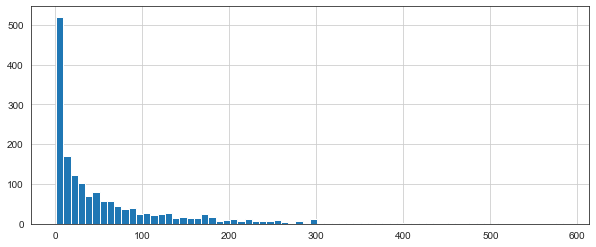

In [23]:
plt.figure(figsize=(10,4))
ratings['num of ratings'].hist(bins=70)

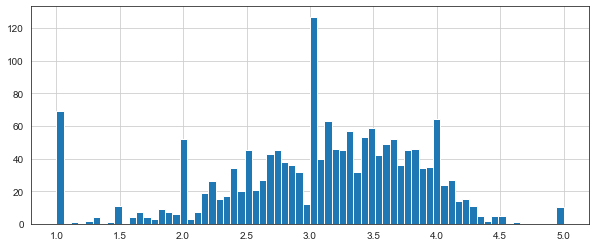

In [24]:
plt.figure(figsize=(10,4))
ratings['rating'].hist(bins=70)

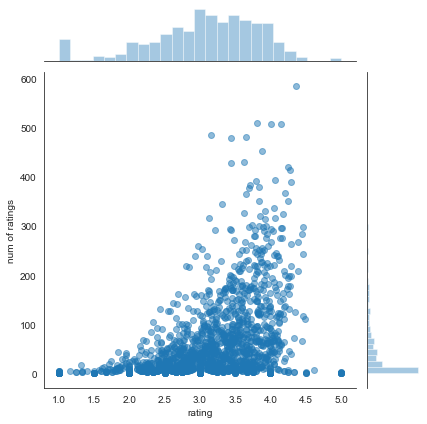

In [25]:
sns.jointplot(x='rating',y='num of ratings',data=ratings,alpha=0.5)

In [26]:
df.head()

,user_id,item_id,rating,timestamp,title_x,title_y,title
0,0,50,5,881250949,Star Wars (1977),Star Wars (1977),Star Wars (1977)
1,290,50,5,880473582,Star Wars (1977),Star Wars (1977),Star Wars (1977)
2,79,50,4,891271545,Star Wars (1977),Star Wars (1977),Star Wars (1977)
3,2,50,5,888552084,Star Wars (1977),Star Wars (1977),Star Wars (1977)
4,8,50,5,879362124,Star Wars (1977),Star Wars (1977),Star Wars (1977)


In [30]:
ratings[(ratings['num of ratings']<5) & (ratings['rating'] >4)]

,rating,num of ratings
title,,
Aiqing wansui (1994),5.000000,1
Anna (1996),4.500000,2
Bitter Sugar (Azucar Amargo) (1996),4.333333,3
Crossfire (1947),4.250000,4
Entertaining Angels: The Dorothy Day Story (1996),5.000000,1
Everest (1998),4.500000,2
"Great Day in Harlem, A (1994)",5.000000,1
"Innocents, The (1961)",4.250000,4
"Letter From Death Row, A (1998)",4.333333,3


## Recommending Similar Movies

In [32]:
moviemat = df.pivot_table(index='user_id',columns='title',values='rating')
moviemat.head(10)

title,'Til There Was You (1997),1-900 (1994),101 Dalmatians (1996),12 Angry Men (1957),187 (1997),2 Days in the Valley (1996),"20,000 Leagues Under the Sea (1954)",2001: A Space Odyssey (1968),3 Ninjas: High Noon At Mega Mountain (1998),"39 Steps, The (1935)",...,Yankee Zulu (1994),Year of the Horse (1997),You So Crazy (1994),Young Frankenstein (1974),Young Guns (1988),Young Guns II (1990),"Young Poisoner's Handbook, The (1995)",Zeus and Roxanne (1997),unknown,Á köldum klaka (Cold Fever) (1994)
user_id,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,2.0,5.0,NaN,NaN,3.0,4.0,NaN,NaN,...,NaN,NaN,NaN,5.0,3.0,NaN,NaN,NaN,4.0,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,2.0,NaN,NaN,NaN,NaN,4.0,NaN,NaN,...,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,4.0,NaN
6,NaN,NaN,NaN,4.0,NaN,NaN,NaN,5.0,NaN,NaN,...,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,4.0,NaN,NaN,5.0,5.0,NaN,4.0,...,NaN,NaN,NaN,5.0,3.0,NaN,3.0,NaN,NaN,NaN
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
ratings.sort_values('num of ratings',ascending=False).head(10)

,rating,num of ratings
title,,
Star Wars (1977),4.359589,584
Contact (1997),3.803536,509
Fargo (1996),4.155512,508
Return of the Jedi (1983),4.007890,507
Liar Liar (1997),3.156701,485
"English Patient, The (1996)",3.656965,481
Scream (1996),3.441423,478
Toy Story (1995),3.878319,452
Air Force One (1997),3.631090,431


In [35]:
ratings.head()

,rating,num of ratings
title,,
'Til There Was You (1997),2.333333,9
1-900 (1994),2.600000,5
101 Dalmatians (1996),2.908257,109
12 Angry Men (1957),4.344000,125
187 (1997),3.024390,41


In [36]:
starwars_user_ratings = moviemat['Star Wars (1977)']
liarliar_user_ratings = moviemat['Liar Liar (1997)']
starwars_user_ratings.head()

user_id
0    5.0
1    5.0
2    5.0
3    NaN
4    5.0
Name: Star Wars (1977), dtype: float64

In [37]:
similar_to_starwars = moviemat.corrwith(starwars_user_ratings)
similar_to_liarliar = moviemat.corrwith(liarliar_user_ratings)

C:\Users\Cornelis\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2522: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
C:\Users\Cornelis\Anaconda3\lib\site-packages\numpy\lib\function_base.py:2451: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)


In [38]:
similar_to_starwars

title
'Til There Was You (1997)                                   0.872872
1-900 (1994)                                               -0.645497
101 Dalmatians (1996)                                       0.211132
12 Angry Men (1957)                                         0.184289
187 (1997)                                                  0.027398
2 Days in the Valley (1996)                                 0.066654
20,000 Leagues Under the Sea (1954)                         0.289768
2001: A Space Odyssey (1968)                                0.230884
3 Ninjas: High Noon At Mega Mountain (1998)                      NaN
39 Steps, The (1935)                                        0.106453
8 1/2 (1963)                                               -0.142977
8 Heads in a Duffel Bag (1997)                             -0.577350
8 Seconds (1994)                                           -0.755929
A Chef in Love (1996)                                       0.868599
Above the Rim (1994)        

In [39]:
corr_starwars = pd.DataFrame(similar_to_starwars,columns=['Correlation'])
corr_starwars.dropna(inplace=True)
corr_starwars.head()

,Correlation
title,
'Til There Was You (1997),0.872872
1-900 (1994),-0.645497
101 Dalmatians (1996),0.211132
12 Angry Men (1957),0.184289
187 (1997),0.027398


In [40]:
corr_starwars.sort_values('Correlation',ascending=False).head(10)

,Correlation
title,
Commandments (1997),1.0
Cosi (1996),1.0
No Escape (1994),1.0
Stripes (1981),1.0
Man of the Year (1995),1.0
Hollow Reed (1996),1.0
"Beans of Egypt, Maine, The (1994)",1.0
"Good Man in Africa, A (1994)",1.0
"Old Lady Who Walked in the Sea, The (Vieille qui marchait dans la mer, La) (1991)",1.0


In [41]:
corr_starwars = corr_starwars.join(ratings['num of ratings'])
corr_starwars.head()

,Correlation,num of ratings
title,,
'Til There Was You (1997),0.872872,9
1-900 (1994),-0.645497,5
101 Dalmatians (1996),0.211132,109
12 Angry Men (1957),0.184289,125
187 (1997),0.027398,41


In [44]:
corr_starwars[corr_starwars['num of ratings']>100].sort_values('Correlation',ascending=False)

,Correlation,num of ratings
title,,
Star Wars (1977),1.000000,584
"Empire Strikes Back, The (1980)",0.748353,368
Return of the Jedi (1983),0.672556,507
Raiders of the Lost Ark (1981),0.536117,420
Austin Powers: International Man of Mystery (1997),0.377433,130
"Sting, The (1973)",0.367538,241
Indiana Jones and the Last Crusade (1989),0.350107,331
Pinocchio (1940),0.347868,101
"Frighteners, The (1996)",0.332729,115


In [43]:
corr_liarliar = pd.DataFrame(similar_to_liarliar,columns=['Correlation'])
corr_liarliar.dropna(inplace=True)
corr_liarliar = corr_liarliar.join(ratings['num of ratings'])
corr_liarliar[corr_liarliar['num of ratings']>100].sort_values('Correlation',ascending=False).head()

,Correlation,num of ratings
title,,
Liar Liar (1997),1.000000,485
Batman Forever (1995),0.516968,114
"Mask, The (1994)",0.484650,129
Down Periscope (1996),0.472681,101
Con Air (1997),0.469828,137
